In [17]:
import sys
# Appending python modules so we can run simulations
sys.path.append("../python")
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pilot4
import numpy as np
import matplotlib.cm as cm
from scipy.ndimage.filters import gaussian_filter

In [67]:
sns.set_palette("coolwarm")
sns.set_style("whitegrid")
sns.set_context("talk")
sns.set(rc={'figure.figsize':(12,10)})

# Importing empirical data

In [5]:
responses = pd.read_json("cleaned_data_exp_4_5_6.json")

# Setting up environment variables

In [6]:
# Ticks of basic stimuli
stim_2_ticks = 285
stim_4_ticks = 247
stim_6_ticks = 163

In [7]:
# RT conversion
stim_2_ms = stim_2_ticks / 60 * 1000
stim_4_ms = stim_2_ticks / 60 * 1000
stim_6_ms = stim_2_ticks / 60 * 1000

In [8]:
scene_to_ms = {
    'stim_2':stim_2_ms,
    'stim_4':stim_4_ms,
    'stim_6':stim_6_ms
}

In [9]:
loaddir = "../data/json/pilot4/types/"
json_files = [pos_json for pos_json in os.listdir(loaddir) if pos_json.endswith('.json')]

# Helper functions

In [10]:
def myplot(x, y, s, bins=1000):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=(800,1000),range=[[0, 800], [0, 1000]])
    heatmap = gaussian_filter(heatmap, sigma=s)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

In [21]:
def hide_code_in_slideshow():   
    from IPython import display
    import binascii
    import os
    uid = binascii.hexlify(os.urandom(8)).decode()    
    html = """<div id="%s"></div>
    <script type="text/javascript">
        $(function(){
            var p = $("#%s");
            if (p.length==0) return;
            while (!p.hasClass("cell")) {
                p=p.parent();
                if (p.prop("tagName") =="body") return;
            }
            var cell = p;
            cell.find(".input").addClass("hide-in-slideshow")
        });
    </script>""" % (uid, uid)
    display.display_html(html, raw=True)

# Figuring out where the ball is when people are responding

Taking from our last meeting in trying to "simulate a participant's experience" I analysed the ball's location across the simulation trace as a function of RT.

For each stimulus, the empirical RT distribution is collected, and each RT sample is converted into simulation ticks with a simple equation (RT * 60 / 1000). These converted RT samples are then mapped to the corresponding location of the ball at that time in the simulation, and plotted as a point.

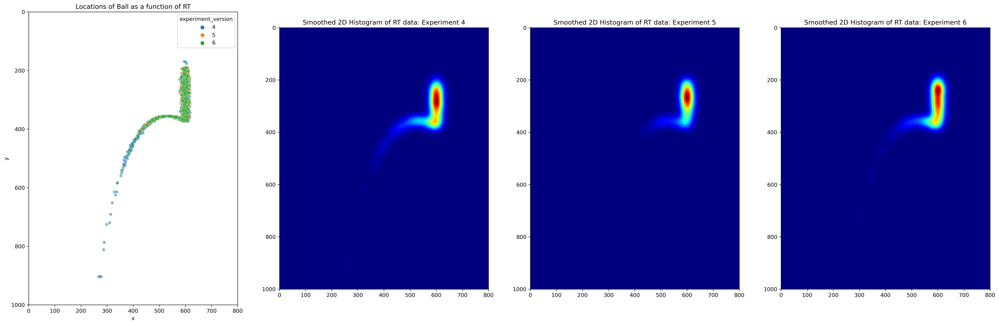

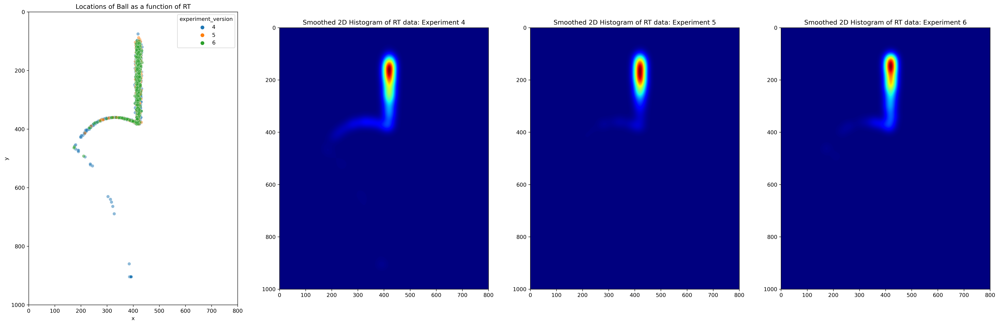

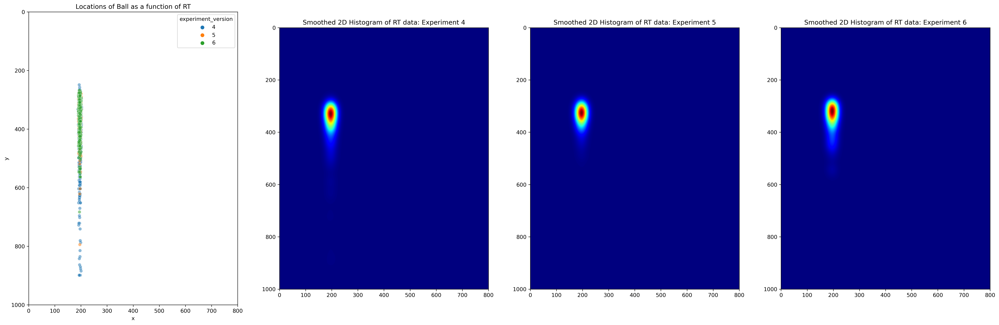

In [29]:
for file in json_files:
    # Get scene name
    scene = file.split('.')[0]
    # Set up figure
    fig, axs = plt.subplots(1,4,figsize=(32,10),dpi=300)
    # Ball trace
    trace = pilot4.scene_trace(loaddir+file)
    # Subset responses to the scene type
    df = responses.loc[(responses.scene_type == scene) & responses.scene_col == True][['rt','subject_id','experiment_version','scene_index','response']]
    # Convery RT into ticks
    df['tick'] = df.rt.apply(lambda x: int(x * 60 / 1000) if x < scene_to_ms[scene] else len(trace)-1)
    df['tick'] = df.tick.apply(lambda x: len(trace)-1 if x > len(trace)-1 else x)
    # Index locations based on RT
    df['x'] = df.tick.apply(lambda x: trace[x][0])
    df.x = df.x.apply(lambda x: x*np.random.normal(1,0.01))
    df['y'] = df.tick.apply(lambda x: trace[x][1])
    
    # Plot ball location as a function of RT
    g=sns.scatterplot(x="x", 
                      y="y", 
                      hue="experiment_version",
                      alpha=0.5,
                      data=df,
                      palette="tab10",
                      ax=axs[0])
    g.set(ylim=(0, 1000),xlim=(0,800))
    g.set_title("Locations of Ball as a function of RT")
    g.invert_yaxis()

    # Compute heatmap (2D histogram)
    x = df.loc[df.experiment_version == 4].x
    y = df.loc[df.experiment_version == 4].y
    s = 16
    img, extent = myplot(x, y, s)
    axs[1].imshow(img, extent=extent, origin='lower', cmap=cm.jet)
    axs[1].set_title("Smoothed 2D Histogram of RT data: Experiment 4")
    axs[1].invert_yaxis()
    
    # Compute heatmap (2D histogram)
    x = df.loc[df.experiment_version == 5].x
    y = df.loc[df.experiment_version == 5].y
    s = 16
    img, extent = myplot(x, y, s)
    axs[2].imshow(img, extent=extent, origin='lower', cmap=cm.jet)
    axs[2].set_title("Smoothed 2D Histogram of RT data: Experiment 5")
    axs[2].invert_yaxis()
    
    # Compute heatmap (2D histogram)
    x = df.loc[df.experiment_version == 6].x
    y = df.loc[df.experiment_version == 6].y
    s = 16
    img, extent = myplot(x, y, s)
    axs[3].imshow(img, extent=extent, origin='lower', cmap=cm.jet)
    axs[3].set_title("Smoothed 2D Histogram of RT data: Experiment 6")
    axs[3].invert_yaxis()

    plt.show()



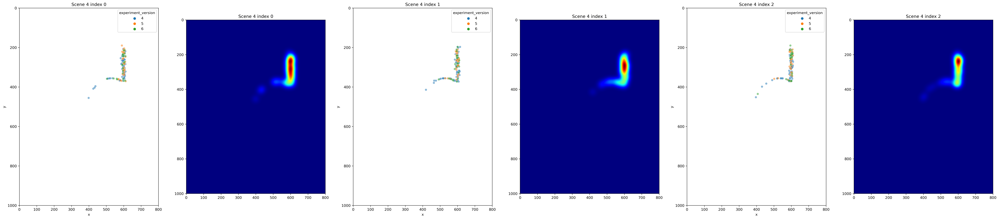

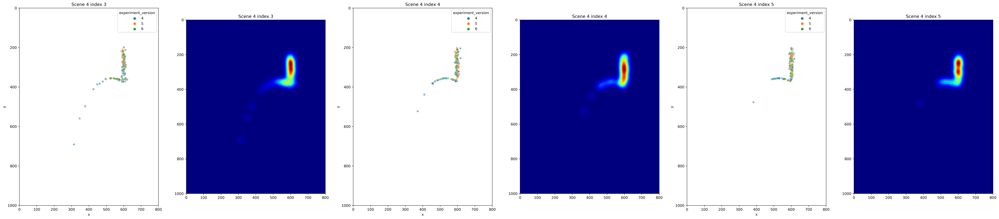

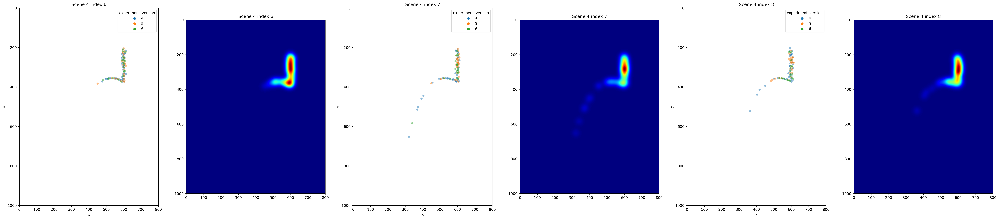

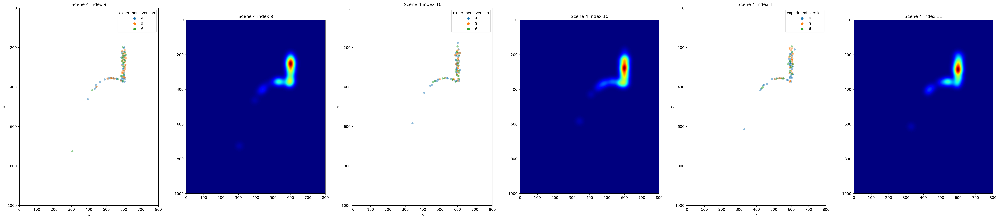

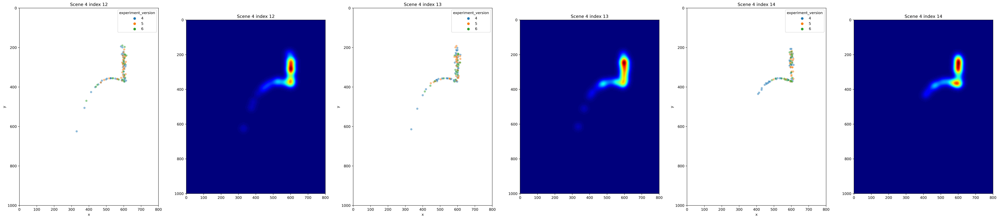

In [23]:
for file in json_files[:1]:
    scene = file.split('.')[0]
    for i in range(5):
        fig, axs = plt.subplots(1,6,figsize=(48,10),dpi=300)
        for j_idx,j in enumerate(range(i*3,i*3+3)):
            # Ball trace
            trace = pilot4.scene_trace(loaddir+file)
            df = responses.loc[(responses.scene_type == scene) 
                               & (responses.scene_col == 'yes') 
                               & (responses.scene_index == j+0.0)
                              ][
                ['rt',
                 'subject_id',
                 'experiment_version',
                 'scene_index',
                 'response']
            ]
            df['tick'] = df.rt.apply(lambda x: int(x * 60 / 1000) if x < scene_to_ms[scene] else len(trace)-1)
            df['tick'] = df.tick.apply(lambda x: len(trace)-1 if x > len(trace)-1 else x)
            df['x'] = df.tick.apply(lambda x: trace[x][0])
            df.x = df.x.apply(lambda x: x*np.random.normal(1,0.01))
            df['y'] = df.tick.apply(lambda x: trace[x][1])
            
            g=sns.scatterplot(x="x", 
                              y="y", 
                              hue="experiment_version",
                              alpha=0.5,
                              data=df,
                              palette="tab10",
                              ax=axs[j_idx*2])
            g.set(ylim=(0, 1000),xlim=(0,800),title=f"Scene {scene.split('_')[1]} index {j}")
            g.invert_yaxis()

            # Generate some test data
            x = df.x
            y = df.y
            s = 16
            img, extent = myplot(x, y, s)
            axs[j_idx*2+1].imshow(img, extent=extent, origin='lower', cmap=cm.jet)
            axs[j_idx*2+1].set_title(f"Scene {scene.split('_')[1]} index {j}")
            axs[j_idx*2+1].invert_yaxis()

        plt.show()


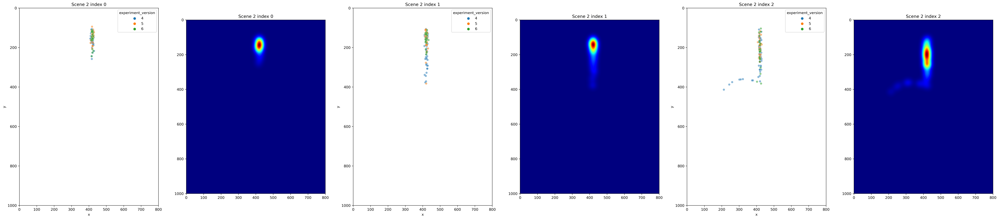

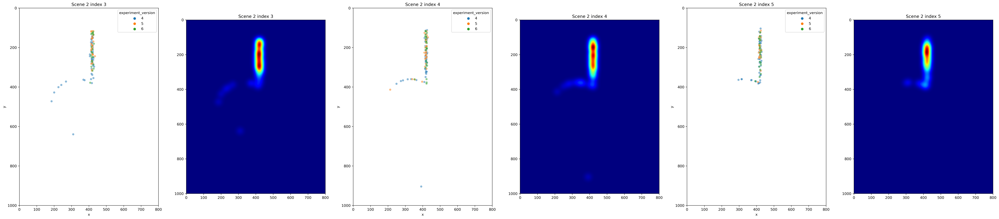

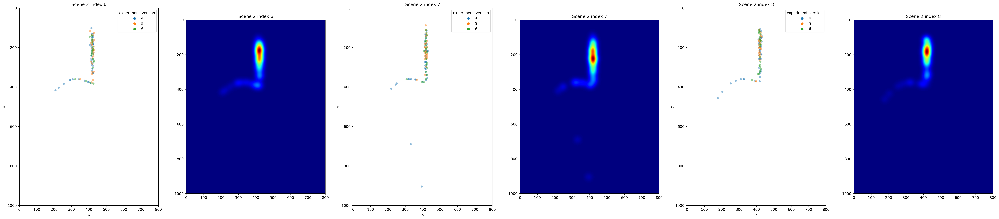

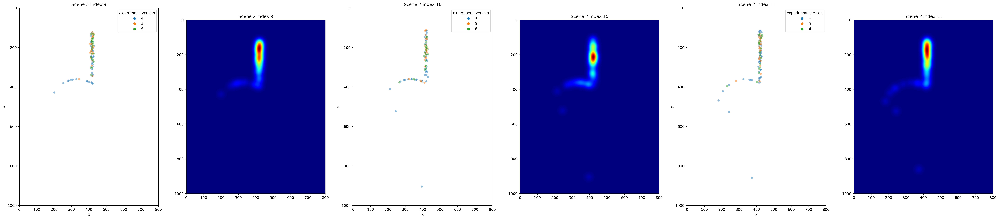

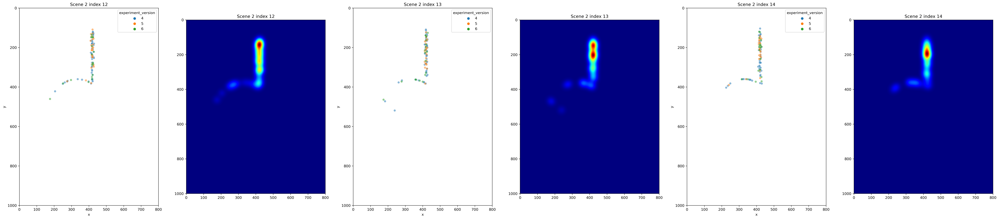

In [24]:
for file in json_files[1:2]:
    scene = file.split('.')[0]
    for i in range(5):
        fig, axs = plt.subplots(1,6,figsize=(48,10),dpi=300)
        for j_idx,j in enumerate(range(i*3,i*3+3)):
            # Ball trace
            trace = pilot4.scene_trace(loaddir+file)
            df = responses.loc[(responses.scene_type == scene) 
                               & (responses.scene_col == 'yes') 
                               & (responses.scene_index == j+0.0)
                              ][
                ['rt',
                 'subject_id',
                 'experiment_version',
                 'scene_index',
                 'response']
            ]
            df['tick'] = df.rt.apply(lambda x: int(x * 60 / 1000) if x < scene_to_ms[scene] else len(trace)-1)
            df['tick'] = df.tick.apply(lambda x: len(trace)-1 if x > len(trace)-1 else x)
            df['x'] = df.tick.apply(lambda x: trace[x][0])
            df.x = df.x.apply(lambda x: x*np.random.normal(1,0.01))
            df['y'] = df.tick.apply(lambda x: trace[x][1])
            
            g=sns.scatterplot(x="x", 
                              y="y", 
                              hue="experiment_version",
                              alpha=0.5,
                              data=df,
                              palette="tab10",
                              ax=axs[j_idx*2])
            g.set(ylim=(0, 1000),xlim=(0,800),title=f"Scene {scene.split('_')[1]} index {j}")
            g.invert_yaxis()

            # Generate some test data
            x = df.x
            y = df.y
            s = 16
            img, extent = myplot(x, y, s)
            axs[j_idx*2+1].imshow(img, extent=extent, origin='lower', cmap=cm.jet)
            axs[j_idx*2+1].set_title(f"Scene {scene.split('_')[1]} index {j}")
            axs[j_idx*2+1].invert_yaxis()

        plt.show()
        


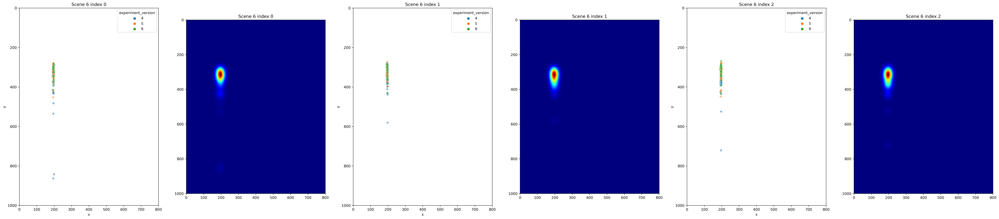

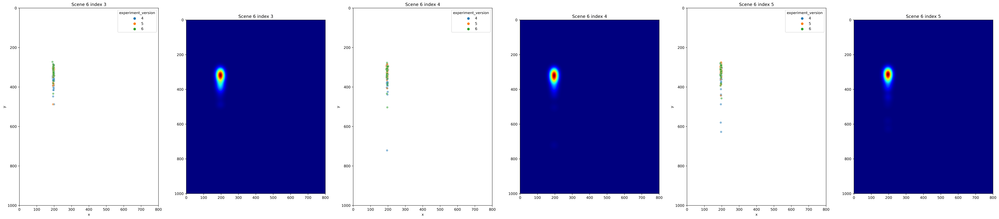

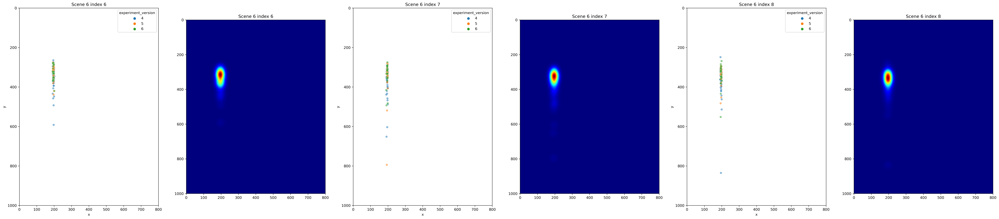

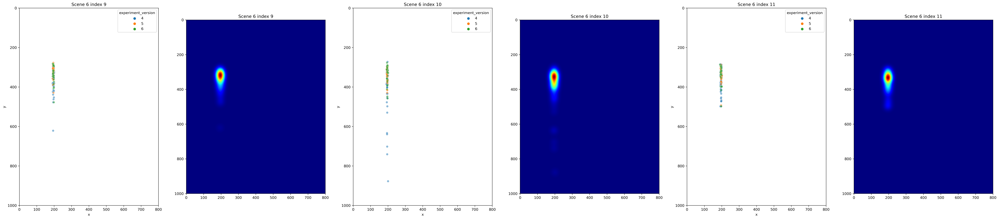

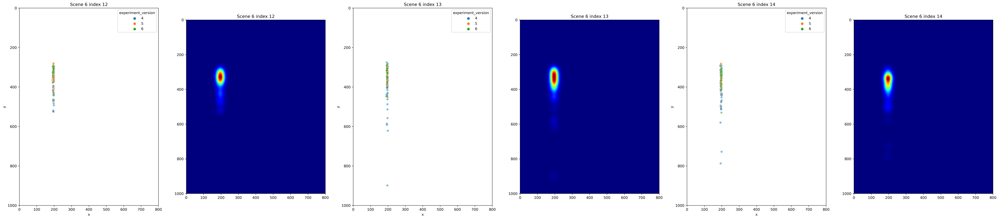

In [26]:
for file in json_files[2:3]:
    scene = file.split('.')[0]
    for i in range(5):
        fig, axs = plt.subplots(1,6,figsize=(48,10),dpi=300)
        for j_idx,j in enumerate(range(i*3,i*3+3)):
            # Ball trace
            trace = pilot4.scene_trace(loaddir+file)
            df = responses.loc[(responses.scene_type == scene) 
                               & (responses.scene_col == 'yes') 
                               & (responses.scene_index == j+0.0)
                              ][
                ['rt',
                 'subject_id',
                 'experiment_version',
                 'scene_index',
                 'response']
            ]
            df['tick'] = df.rt.apply(lambda x: int(x * 60 / 1000) if x < scene_to_ms[scene] else len(trace)-1)
            df['tick'] = df.tick.apply(lambda x: len(trace)-1 if x > len(trace)-1 else x)
            df['x'] = df.tick.apply(lambda x: trace[x][0])
            df.x = df.x.apply(lambda x: x*np.random.normal(1,0.01))
            df['y'] = df.tick.apply(lambda x: trace[x][1])
            
            g=sns.scatterplot(x="x", 
                              y="y", 
                              hue="experiment_version",
                              alpha=0.5,
                              data=df,
                              palette="tab10",
                              ax=axs[j_idx*2])
            g.set(ylim=(0, 1000),xlim=(0,800),title=f"Scene {scene.split('_')[1]} index {j}")
            g.invert_yaxis()

            # Generate some test data
            x = df.x
            y = df.y
            s = 16
            img, extent = myplot(x, y, s)
            axs[j_idx*2+1].imshow(img, extent=extent, origin='lower', cmap=cm.jet)
            axs[j_idx*2+1].set_title(f"Scene {scene.split('_')[1]} index {j}")
            axs[j_idx*2+1].invert_yaxis()

        plt.show()
        


<AxesSubplot:xlabel='rt', ylabel='Count'>

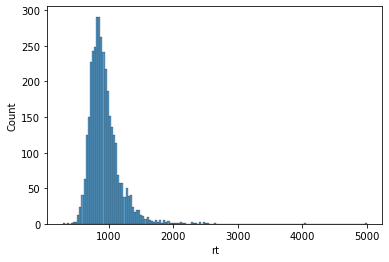

In [33]:
sns.histplot(x='rt',data=responses.loc[responses.scene_type == 'stim_6'])

In [34]:
sns.boxplot(x='scene_accuracy')

ValueError: Could not interpret input 'scene_accuracy'

In [71]:
df = pd.DataFrame(responses.groupby(['scene_index','scene_type','experiment_version',"scene_col"]).correct.apply(lambda x: sum(x) / len(x)))

In [72]:
df.columns = df.columns.get_level_values(0)

In [73]:
df = df.reset_index()

Text(0.5, 1.0, 'Accuracy across scene indices in Scene 6')

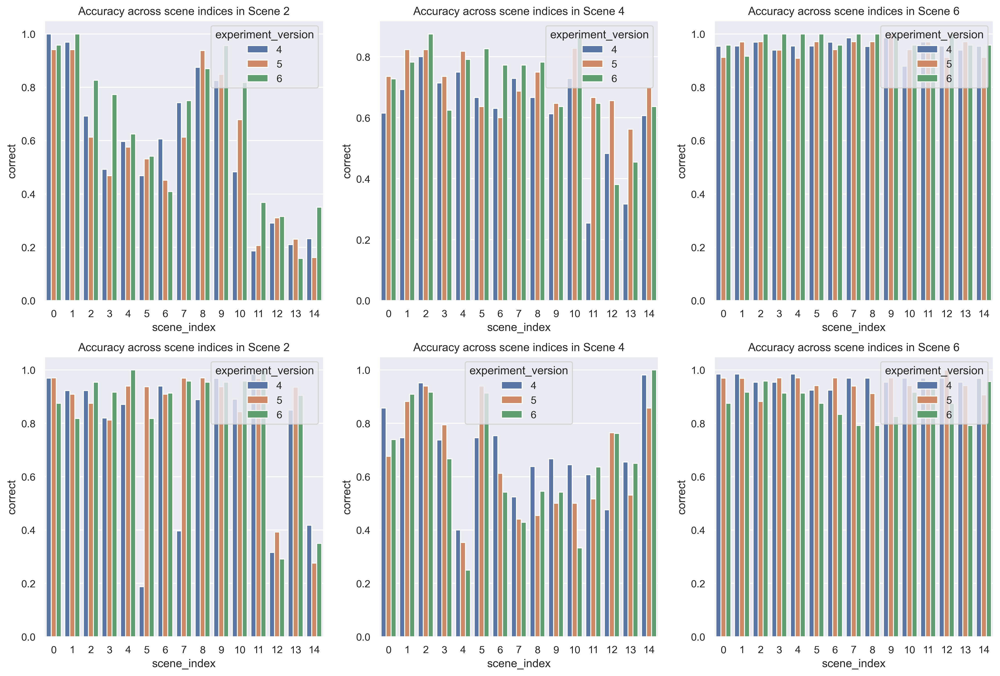

In [77]:
fig, axs = plt.subplots(2,3,figsize=(18,12),dpi=300)
g=sns.barplot(x='scene_index',y='correct',hue='experiment_version',data=df.loc[(df.scene_type=='stim_2')
                                                                              & (df.scene_col=="yes")],ax=axs[0,0])
g.set_title("Accuracy across scene indices in Scene 2")
g=sns.barplot(x='scene_index',y='correct',hue='experiment_version',data=df.loc[(df.scene_type=='stim_4')
                                                                              & (df.scene_col=="yes")],ax=axs[0,1])
g.set_title("Accuracy across scene indices in Scene 4")
g=sns.barplot(x='scene_index',y='correct',hue='experiment_version',data=df.loc[(df.scene_type=='stim_6')
                                                                              & (df.scene_col=="yes")],ax=axs[0,2])
g.set_title("Accuracy across scene indices in Scene 6")

g=sns.barplot(x='scene_index',y='correct',hue='experiment_version',data=df.loc[(df.scene_type=='stim_2')
                                                                              & (df.scene_col=="no")],ax=axs[1,0])
g.set_title("Accuracy across scene indices in Scene 2")
g=sns.barplot(x='scene_index',y='correct',hue='experiment_version',data=df.loc[(df.scene_type=='stim_4')
                                                                              & (df.scene_col=="no")],ax=axs[1,1])
g.set_title("Accuracy across scene indices in Scene 4")
g=sns.barplot(x='scene_index',y='correct',hue='experiment_version',data=df.loc[(df.scene_type=='stim_6')
                                                                              & (df.scene_col=="no")],ax=axs[1,2])
g.set_title("Accuracy across scene indices in Scene 6")

In [83]:
responses['yesno'] = responses.response == responses.condition

In [85]:
responses.yesno = responses.yesno.apply(lambda x: "yes" if x else "no")

In [90]:
responses.groupby('scene_type').yesno.barplot()

AttributeError: 'SeriesGroupBy' object has no attribute 'barplot'

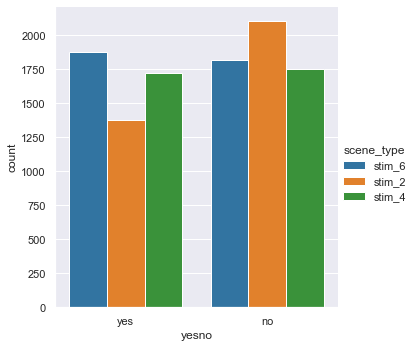

In [97]:
sns.catplot(x="yesno", kind="count", palette="tab10", data=responses,hue='scene_type')